# 1.結果の取得


In [230]:
import pandas as pd

Hammett_lcb_path = "../BO_result/initsize5i_LCB_q/FP/FP_BO_resultsFP_p_0.7_init5_picks_lcb.csv"
df_Hammett_lcb = pd.read_csv(Hammett_lcb_path)

FP_lcb_path = "../BO_result/initsize5_LCB_per_dim_p_0.9/FP/FP_BO_resultsFP_p_0.7_init5_picks_lcb.csv"
df_FP_lcb = pd.read_csv(FP_lcb_path)

Random_path = "../BO_result/initmax5_remax_5/FP/FP_BO_resultsFP_p_0.7_init5_picks_rand.csv"
df_Random = pd.read_csv(Random_path)

distance_path = "../BO_result/distances/distances_to_target.csv"
df_distance = pd.read_csv(distance_path)

# print("Hammett LCB DataFrame:")
# print(df_Hammett_lcb.head())
# print("distances_Index")
# print(df_distance.head())

# 2.インデックス距離を対応

In [231]:
# 1) mapping 辞書を作成
#    dist_col に 'distance' でも 'eucled_distance' でも OK
dist_map = df_distance.set_index('index')['distance']  # Series

# 2) run 名を index に設定して、applymap で全セルを置換
Hammett_distance = (
    df_Hammett_lcb
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

FP_distance = (
    df_FP_lcb
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

Random_distance = (
    df_Random
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

# Hammett_distance

In [232]:
Hammett_distance_best = Hammett_distance.cummin(axis=1)
FP_distance_best = FP_distance.cummin(axis=1)
Random_distance_best = Random_distance.cummin(axis=1)
# Random_distance_best

# 3.可視化

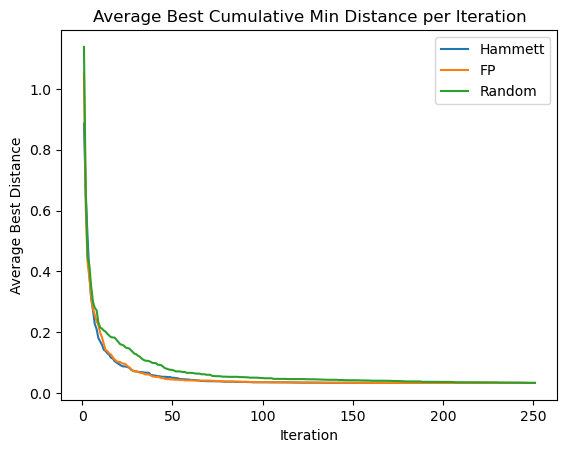

In [233]:
import matplotlib.pyplot as plt

# Compute the average best distance across runs for each method
mean_hammett = Hammett_distance_best.mean(axis=0)
mean_fp = FP_distance_best.mean(axis=0)
mean_random = Random_distance_best.mean(axis=0)

# X-axis: iteration numbers
iterations = range(1, len(mean_hammett) + 1)

# Plotting
plt.figure()
plt.plot(iterations, mean_hammett, label='Hammett')
plt.plot(iterations, mean_fp, label='FP')
plt.plot(iterations, mean_random, label='Random')
plt.xlabel("Iteration")
plt.ylabel("Average Best Distance")
plt.title("Average Best Cumulative Min Distance per Iteration")
plt.legend()
plt.show()

# 4.PCAの結果

In [234]:
Hammett_features_path = "../train/result0.xlsx"
FP_features_path = "../FP_BO.ipynb/fp.csv"


Hammett_features = pd.read_excel(Hammett_features_path)
FP_features = pd.read_csv(FP_features_path)

# Hammett_features.head()

Hammett_cols = ["Index 14", "Index 15", "Index 16", "Index 0", "Index 20"]

df_FP_NONE1 = FP_features.loc[:, FP_features.nunique(dropna=False) > 1]

# カラム名リスト
FP_cols = df_FP_NONE1.columns.tolist()
print("FP_cols:", len(FP_cols))

FP_cols: 189


寄与率（各主成分の分散説明率）: [0.21907394 0.1590136 ]
累積寄与率: [0.21907394 0.37808753]


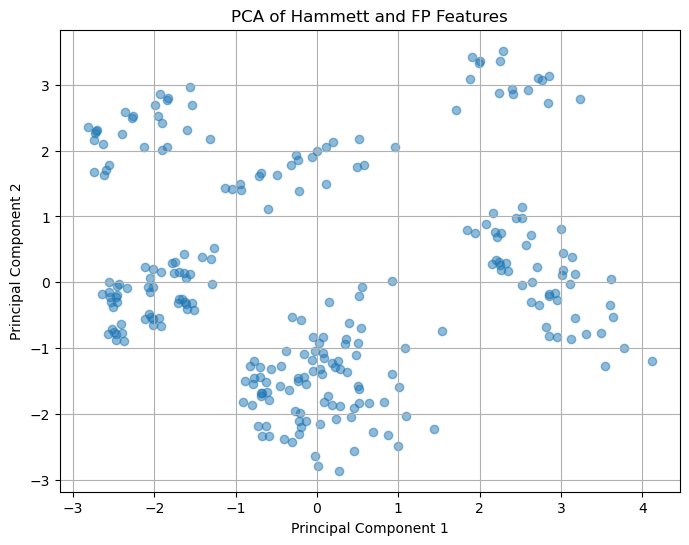

In [235]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD, PCA
import numpy as np

# 1) Hammett（例：3 列）を標準化
sc_h = StandardScaler()
X_h = sc_h.fit_transform(Hammett_features[Hammett_cols])

# 2) FP（例：1024 列）は TruncatedSVD で 10 次元に圧縮
svd = TruncatedSVD(n_components=10, random_state=42)
X_f = svd.fit_transform(FP_features[FP_cols])
# X_f = FP_features[FP_cols].values

# 3) それぞれを結合して，最終的に 2 次元 PCA
X_concat = np.hstack([X_h, X_f])
sc_all = StandardScaler()
X_std = sc_all.fit_transform(X_concat)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_concat)

# 4) 寄与率を出力
print("寄与率（各主成分の分散説明率）:", pca.explained_variance_ratio_)
print("累積寄与率:", pca.explained_variance_ratio_.cumsum())


pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df

# Plotting the PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.title('PCA of Hammett and FP Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

# 各軸の寄与率を表示




# 5.PCA VS distance

In [236]:
from rdkit import Chem

df_pca_distance = pd.DataFrame({
    'PC1': pca_df['PC1'],
    'PC2': pca_df['PC2'],
    'distance': df_distance['distance'],
    'SMILES' : Hammett_features['dimer_smi']
})

pca_path = "../BO_result/pca_distance.csv"
df_pca_distance.to_csv(pca_path, index=False)




# (1) SMILES から Mol オブジェクトを生成
df_pca_distance['mol'] = df_pca_distance['SMILES'].apply(Chem.MolFromSmiles)


In [237]:
import base64
from io import BytesIO
from rdkit import Chem
from rdkit.Chem import Draw
# ライブラリーのインポート
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.plotting import figure
output_notebook()



def mol_to_base64(mol):
    """RDKitのMolオブジェクトからBase64エンコードされた画像を生成"""
    if mol is None:
        return ""
    img = Draw.MolToImage(mol, size=(200, 200))  # 分子画像を生成
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode("utf-8")


# (2) Base64エンコードされた画像をDataFrameに追加
df_pca_distance['mol_image'] = df_pca_distance['mol'].apply(mol_to_base64)

Loading BokehJS ...

In [238]:
from bokeh.models import ColumnDataSource

# 必要なカラムだけ抜き出す
plot_df = df_pca_distance[[
    'PC1', 'PC2', 'SMILES', 'distance', 'mol_image'
]].copy()


In [239]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, ColorBar, Slider, CustomJS
from bokeh.transform import transform
from bokeh.palettes import Viridis256
from bokeh.layouts import column

# Assuming df_pca_distance has been defined with the necessary columns
# Make sure mol_image column exists as before

# Prepare data source
df_plot = plot_df.copy()
df_plot['clipped_distance'] = df_plot['distance']
source = ColumnDataSource(df_plot)

# Create color mapper (initial high threshold)
initial_threshold = 1.0
palette_reversed = Viridis256[::-1]
color_mapper = LinearColorMapper(palette=palette_reversed, low=0, high=initial_threshold)

# Figure
p = figure(width=700, height=600,
           title="PCA Scatter with Threshold Slider",
           x_axis_label='PC1', y_axis_label='PC2',
           tools="pan,wheel_zoom,box_zoom,reset")

# Points
renderer = p.circle('PC1', 'PC2', source=source, size=10,
                    fill_color=transform('clipped_distance', color_mapper),
                    line_color=None, alpha=0.7)

# Color bar
color_bar = ColorBar(color_mapper=color_mapper, location=(0,0), title='Distance')
p.add_layout(color_bar, 'right')

# Hover tool
hover = HoverTool(renderers=[renderer],
                  tooltips="""
                  <div style="width:200px;">
                    <div><strong>SMILES:</strong> @SMILES</div>
                    <div><strong>Distance:</strong> @distance{0.000}</div>
                    <div>
                      <img src="data:image/png;base64,@mol_image"
                           alt="Molecule" style="display:block;margin:5px auto;" width="150"/>
                    </div>
                  </div>
                  """)
p.add_tools(hover)

# Slider for threshold
slider = Slider(start=0, end=float(df_plot['distance'].max()), value=initial_threshold, step=0.01,
                title="Distance Threshold")
callback = CustomJS(args=dict(color_mapper=color_mapper, source=source), code="""
    const data = source.data;
    const dist = data['distance'];
    const clipped = data['clipped_distance'];
    const thr = cb_obj.value;
    for (let i = 0; i < dist.length; i++) {
        clipped[i] = dist[i] <= thr ? dist[i] : thr;
    }
    color_mapper.high = thr;
    source.change.emit();
""")
slider.js_on_change('value', callback)

# Layout and show
layout = column(slider, p)
show(layout)




# 6.探索における選択分子

In [240]:
df_Hammett_lcb_ex = df_Hammett_lcb.head(1)
# 向きを変える 1行目を消す
df_Hammett_lcb_ex = df_Hammett_lcb_ex.T
df_Hammett_lcb_ex = df_Hammett_lcb_ex.iloc[1:].reset_index(drop=True)

df_Hammett_lcb_ex["iteration"] = df_Hammett_lcb_ex.index+1
df_Hammett_lcb_ex


#  現在の1列目（元2列目）の名前を確認
old_name = df_Hammett_lcb_ex.columns[0]
print(f"Renaming column: {old_name}")

#  新しい名前にリネーム
df_Hammett_lcb_ex= df_Hammett_lcb_ex.rename(columns={old_name: "Index"})
df_Hammett_lcb_ex

Renaming column: 0


,Index,iteration
0,234,1
1,235,2
2,232,3
3,219,4
4,228,5
...,...,...
246,250,247
247,253,248
248,193,249
249,129,250


In [241]:


# --- 前提：df_pca_distance と df_iterations が定義済み ---
# df_pca_distance: index が元データIndex、カラムに ['PC1','PC2','distance','SMILES','mol_image']
# df_iterations: DataFrame with ['Index','iteration']

# マージしてプロット用 DataFrame を作成
df_plot = pd.merge(
    df_Hammett_lcb_ex, 
    plot_df.reset_index(), 
    left_on='Index', right_on='index'
).drop(columns=['index'])

# クリップ用列と初期 alpha 列を追加
initial_thr = 1.0
initial_iter = df_plot['iteration'].max()
df_plot['clipped_distance'] = df_plot['distance'].clip(upper=initial_thr)
# 初期はすべて可視化（近いもの α=0.8、遠いもの α=0.2）
df_plot['alpha'] = [0.8 if it <= initial_iter else 0.2 for it in df_plot['iteration']]

# ColumnDataSource
source = ColumnDataSource(df_plot)

# カラーマッパー（反転パレット）
color_mapper = LinearColorMapper(palette=Viridis256[::-1], low=0, high=initial_thr)

# Figure
p = figure(width=700, height=600,
           title="PCA Scatter with Threshold & Iteration Slider",
           x_axis_label='PC1', y_axis_label='PC2',
           tools="pan,wheel_zoom,box_zoom,reset")

# Glyph: fill_color, fill_alpha を data column からマッピング
renderer = p.circle('PC1', 'PC2', source=source, size=10,
                    fill_color=transform('clipped_distance', color_mapper),
                    line_color=None, fill_alpha='alpha')

# ColorBar
color_bar = ColorBar(color_mapper=color_mapper, location=(0,0), title='Distance')
p.add_layout(color_bar, 'right')

# HoverTool
hover = HoverTool(renderers=[renderer],
    tooltips="""
    <div style="width:200px;">
      <div><strong>SMILES:</strong> @SMILES</div>
      <div><strong>Distance:</strong> @distance{0.000}</div>
      <div><strong>Iteration:</strong> @iteration</div>
      <div>
        <img src="data:image/png;base64,@mol_image"
             alt="Molecule" style="display:block;margin:5px auto;" width="150"/>
      </div>
    </div>
    """
)
p.add_tools(hover)

# Sliders
slider_dist = Slider(start=0, end=float(df_plot['distance'].max()), value=initial_thr, step=0.01,
                     title="Distance Threshold")
slider_iter = Slider(start=0, end=int(df_plot['iteration'].max()), value=int(df_plot['iteration'].max()), step=1,
                     title="Max Iteration")

# 共通コールバック
callback = CustomJS(args=dict(src=source, mapper=color_mapper,
                              sd=slider_dist, si=slider_iter), code="""
    const data = src.data;
    const dist = data['distance'];
    const clip = data['clipped_distance'];
    const iters = data['iteration'];
    const alpha = data['alpha'];
    const thr = sd.value;
    const ith = si.value;
    // 更新
    for (let i = 0; i < dist.length; i++) {
        clip[i] = dist[i] <= thr ? dist[i] : thr;
        alpha[i] = (iters[i] <= ith) ? 0.8 : 0.2;
    }
    mapper.high = thr;
    src.change.emit();
""")
slider_dist.js_on_change('value', callback)
slider_iter.js_on_change('value', callback)

# レイアウト表示
layout = column(slider_dist, slider_iter, p)
show(layout)


In [242]:
df_FP_lcb_ex = df_FP_lcb.iloc[1:2]
# 向きを変える 1行目を消す
df_FP_lcb_ex = df_FP_lcb_ex.T
df_FP_lcb_ex = df_FP_lcb_ex.iloc[1:].reset_index(drop=True)
df_FP_lcb_ex["iteration"] = df_FP_lcb_ex.index+1
df_FP_lcb_ex    
#
#  現在の1列目（元2列目）の名前を確認
old_name = df_FP_lcb_ex.columns[0]
print(f"Renaming column: {old_name}")
#  新しい名前にリネーム
df_FP_lcb_ex = df_FP_lcb_ex.rename(columns={old_name: "Index"})
df_FP_lcb_ex

Renaming column: 1


,Index,iteration
0,8,1
1,36,2
2,38,3
3,40,4
4,20,5
...,...,...
246,254,247
247,253,248
248,67,249
249,129,250


In [243]:
# --- 前提：df_pca_distance と df_iterations が定義済み ---
# df_pca_distance: index が元データIndex、カラムに ['PC1','PC2','distance','SMILES','mol_image']
# df_iterations: DataFrame with ['Index','iteration']

# マージしてプロット用 DataFrame を作成
df_plot = pd.merge(
    df_FP_lcb_ex, 
    plot_df.reset_index(), 
    left_on='Index', right_on='index'
).drop(columns=['index'])

# クリップ用列と初期 alpha 列を追加
initial_thr = 1.0
initial_iter = df_plot['iteration'].max()
df_plot['clipped_distance'] = df_plot['distance'].clip(upper=initial_thr)
# 初期はすべて可視化（近いもの α=0.8、遠いもの α=0.2）
df_plot['alpha'] = [0.8 if it <= initial_iter else 0.2 for it in df_plot['iteration']]

# ColumnDataSource
source = ColumnDataSource(df_plot)

# カラーマッパー（反転パレット）
color_mapper = LinearColorMapper(palette=Viridis256[::-1], low=0, high=initial_thr)

# Figure
p = figure(width=700, height=600,
           title="PCA Scatter with Threshold & Iteration Slider",
           x_axis_label='PC1', y_axis_label='PC2',
           tools="pan,wheel_zoom,box_zoom,reset")

# Glyph: fill_color, fill_alpha を data column からマッピング
renderer = p.circle('PC1', 'PC2', source=source, size=10,
                    fill_color=transform('clipped_distance', color_mapper),
                    line_color=None, fill_alpha='alpha')

# ColorBar
color_bar = ColorBar(color_mapper=color_mapper, location=(0,0), title='Distance')
p.add_layout(color_bar, 'right')

# HoverTool
hover = HoverTool(renderers=[renderer],
    tooltips="""
    <div style="width:200px;">
      <div><strong>SMILES:</strong> @SMILES</div>
      <div><strong>Distance:</strong> @distance{0.000}</div>
      <div><strong>Iteration:</strong> @iteration</div>
      <div>
        <img src="data:image/png;base64,@mol_image"
             alt="Molecule" style="display:block;margin:5px auto;" width="150"/>
      </div>
    </div>
    """
)
p.add_tools(hover)

# Sliders
slider_dist = Slider(start=0, end=float(df_plot['distance'].max()), value=initial_thr, step=0.01,
                     title="Distance Threshold")
slider_iter = Slider(start=0, end=int(df_plot['iteration'].max()), value=int(df_plot['iteration'].max()), step=1,
                     title="Max Iteration")

# 共通コールバック
callback = CustomJS(args=dict(src=source, mapper=color_mapper,
                              sd=slider_dist, si=slider_iter), code="""
    const data = src.data;
    const dist = data['distance'];
    const clip = data['clipped_distance'];
    const iters = data['iteration'];
    const alpha = data['alpha'];
    const thr = sd.value;
    const ith = si.value;
    // 更新
    for (let i = 0; i < dist.length; i++) {
        clip[i] = dist[i] <= thr ? dist[i] : thr;
        alpha[i] = (iters[i] <= ith) ? 0.8 : 0.2;
    }
    mapper.high = thr;
    src.change.emit();
""")
slider_dist.js_on_change('value', callback)
slider_iter.js_on_change('value', callback)

# レイアウト表示
layout = column(slider_dist, slider_iter, p)
show(layout)